# EUR-USD Analysis

## Imports

In [177]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import altair as alt
import statsmodels.api as sm
import numpy as np

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose

from ydata_profiling import ProfileReport

from sklearn.model_selection import train_test_split

plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = 20, 8

In [31]:
%matplotlib inline

## EDA

In [2]:
exchange = pd.read_csv("exchange_v2.csv")
exchange.head()

,date,Open,High,Low,Close,Adj Close,Volume,currency
0,2014-09-17,1.295908,1.298000,1.294090,1.295908,1.295908,0,EURUSD=X
1,2014-09-18,1.285017,1.292689,1.285017,1.285000,1.285000,0,EURUSD=X
2,2014-09-19,1.292140,1.292959,1.283203,1.292006,1.292006,0,EURUSD=X
3,2014-09-22,1.284076,1.286900,1.281953,1.284142,1.284142,0,EURUSD=X
4,2014-09-23,1.285298,1.289930,1.284589,1.285149,1.285149,0,EURUSD=X


In [94]:
eurusd = exchange.loc[exchange['currency'] == 'EURUSD=X']

In [86]:
alt.Chart(eurusd).mark_line().encode(
    x=alt.X('date:T', axis=alt.Axis(format='%Y-%m')),
    y=alt.Y('Close:Q', scale=alt.Scale(domain=[eurusd['Close'].min() - 0.05, eurusd['Close'].max() + 0.05]))
).properties(
    width=1000,
    height=300,
    title="EUR-USD Exchange Rate"
)

alt.Chart(...)

Here we can observe the development of the EUR-USD exchange rate since October 2014.  
Important sections to note:
- The appreciation of the USD over EUR between 2020 and 2021 (covid, US printing money, etc).
- The depreciation of the USD over EUR between 2021 and 2022 hitting a minimum (Ukraine war, US recesion).

In [248]:
# Checking for nulls
eurusd.isnull().sum()

date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
currency     0
dtype: int64

In [88]:
# Note, the "Volume" column is empty with zeroes.
eurusd["Volume"].unique()

array([0])

In [120]:
eurusd['date'] = pd.to_datetime(eurusd['date'])
eurusd.set_index('date', inplace=True, drop=False)

eurusd_res = eurusd.resample('D').asfreq()
alt.Chart(eurusd_res).mark_line().encode(
    x=alt.X('date:T', axis=alt.Axis(format='%Y-%m')),
    y=alt.Y('Close:Q', scale=alt.Scale(domain=[eurusd_res['Close'].min() - 0.05, eurusd_res['Close'].max() + 0.05]))
).properties(
    width=1000,
    height=300,
    title="EUR-USD Exchange Rate including weekends"
)

/var/folders/d3/mnfdbp9x09q8tn1q87l6qx0h0000gn/T/ipykernel_72540/2573395761.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eurusd['date'] = pd.to_datetime(eurusd['date'])


alt.Chart(...)

In [90]:
profile = ProfileReport(eurusd, tsmode=True)

In [19]:
profile

## Data Preprocessing

### Imputation

We need to add expected values for missing dates.

In [125]:
eurusd_res.fillna(method='bfill', inplace=True)

print(eurusd_res.isnull().sum())

alt.Chart(eurusd_res).mark_line().encode(
    x=alt.X('date:T', axis=alt.Axis(format='%Y-%m')),
    y=alt.Y('Close:Q', scale=alt.Scale(domain=[eurusd['Close'].min() - 0.05, eurusd['Close'].max() + 0.05]))
).properties(
    width=1000,
    height=300,
    title="EUR-USD Exchange Rate (Imputed)"
)

date            0
Open            0
High            0
Low             0
Close           0
Adj Close       0
Volume          0
currency        0
mov7         3363
dtype: int64


alt.Chart(...)

### Smoothing

To smooth the dataset let's use the moving averages.

In [127]:
eurusd_res['mov9'] = eurusd_res['Close'].rolling(9).mean()
display(eurusd_res)
alt.Chart(eurusd_res).mark_line().encode(
    x=alt.X('date:T', axis=alt.Axis(format='%Y-%m')),
    y=alt.Y('mov9:Q', scale=alt.Scale(domain=[eurusd_res['Close'].min() - 0.05, eurusd_res['Close'].max() + 0.05]))
).properties(
    width=1000,
    height=300,
    title="EUR-USD Exchange Rate (Imputed)"
)

,date,Open,High,Low,Close,Adj Close,Volume,currency,mov7,mov9
date,,,,,,,,,,
2014-09-17,2014-09-17,1.295908,1.298000,1.294090,1.295908,1.295908,0.0,EURUSD=X,NaN,NaN
2014-09-18,2014-09-18,1.285017,1.292689,1.285017,1.285000,1.285000,0.0,EURUSD=X,NaN,NaN
2014-09-19,2014-09-19,1.292140,1.292959,1.283203,1.292006,1.292006,0.0,EURUSD=X,NaN,NaN
2014-09-20,2014-09-22,1.284076,1.286900,1.281953,1.284142,1.284142,0.0,EURUSD=X,NaN,NaN
2014-09-21,2014-09-22,1.284076,1.286900,1.281953,1.284142,1.284142,0.0,EURUSD=X,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
2023-11-27,2023-11-27,1.094044,1.095926,1.092586,1.094044,1.094044,0.0,EURUSD=X,1.092610,1.092186
2023-11-28,2023-11-28,1.095842,1.100715,1.093506,1.095842,1.095842,0.0,EURUSD=X,1.092788,1.092757
2023-11-29,2023-11-29,1.100594,1.101686,1.096119,1.100594,1.100594,0.0,EURUSD=X,1.094041,1.093856


alt.Chart(...)

In [149]:
# Calculate moving averages
eurusd_res['mov7'] = eurusd_res['Close'].rolling(7).mean()
eurusd_res['mov30'] = eurusd_res['Close'].rolling(30).mean()
eurusd_res['mov90'] = eurusd_res['Close'].rolling(90).mean()

# Calculate the overall min and max values across all moving averages
min_value = eurusd_res[['mov7', 'mov9', 'mov30', 'mov90']].min().min()
max_value = eurusd_res[['mov7', 'mov9', 'mov30', 'mov90']].max().max()

alt.Chart(eurusd_res).mark_line().transform_fold(
    fold=['mov7', 'mov30', 'mov90'], 
    as_=['variable', 'value']
).encode(
    x=alt.X('date:T', axis=alt.Axis(format='%Y-%m')),
    y=alt.Y('value:Q', scale=alt.Scale(domain=[min_value-0.03, max_value+0.03])),
    color='variable:N'
).properties(
    width=800,
    height=300,
    title="EUR-USD Exchange Rate (Smoothened with Moving Averages)"
)

alt.Chart(...)

### Detecting outliers with Bollinger Bands

In [173]:
eurusd_res['band30'] = eurusd_res['Close'].rolling(30).std() * 3
eurusd_res['upperBand30'] = eurusd_res['mov30'] + eurusd_res['Close'].rolling(30).std() * 3
eurusd_res['lowerBand30'] = eurusd_res['mov30'] + eurusd_res['Close'].rolling(30).std() * (-3)


# Create the area chart for the Bollinger Bands
band_area = alt.Chart(eurusd_res).mark_area(opacity=0.3, color='lightblue').encode(
    x=alt.X('date:T', axis=alt.Axis(format='%Y-%m')),
    y=alt.Y('lowerBand30:Q', scale=alt.Scale(domain=[min_value-0.03, max_value+0.03])),
    y2='upperBand30:Q'
)

# Create the line chart for the moving average
mov_line = alt.Chart(eurusd_res).mark_line(color='orange').encode(
    x=alt.X('date:T', axis=alt.Axis(format='%Y-%m')),
    y=alt.Y('Close:Q', scale=alt.Scale(domain=[min_value-0.03, max_value+0.03])),
)

# Create the points chart for threshold surpassing
threshold_points = alt.Chart(eurusd_res).mark_point(color='red').encode(
    x=alt.X('date:T', axis=alt.Axis(format='%Y-%m')),
    y=alt.Y('Close:Q'),
    opacity=alt.condition(
        (alt.datum.Close > alt.datum.upperBand30) | (alt.datum.Close < alt.datum.lowerBand30),
        alt.value(1),  # if the condition is true, the point is fully opaque
        alt.value(0)   # if the condition is false, the point is not shown
    )
)

# Combine the area, line, and points charts
final_chart = alt.layer(band_area, mov_line, threshold_points).properties(
    width=800,
    height=300,
    title="EUR-USD Bollinger Bands"
)

final_chart

alt.LayerChart(...)

## Data Splitting
Splitting data from now on, so that we can proof against the test set.

In [179]:
eurusd_res = eurusd_res[["date", "Open", "High", "Low", "Close", "Adj Close", "Volume", "currency"]]

<AxesSubplot: xlabel='date'>

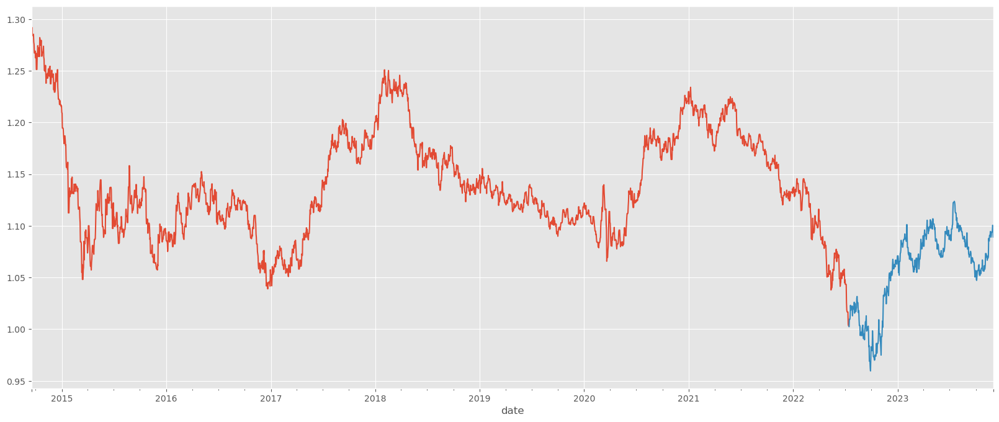

In [185]:
eurusd_train = eurusd_res.iloc[0:int(eurusd_res.shape[0]*0.85)]
eurusd_test = eurusd_res.iloc[int(eurusd_res.shape[0]*0.85):]

eurusd_train['Close'].plot()
eurusd_test['Close'].plot()

## Benchmark Models

This is extracted from the Forecasting book, chapter 3. Here, it is recommended to use the "simplest" forecasting methods as base benchmarks for more complex models. If the other models are not better than basic benchmarks, we discard the model.

### Average Method

In [239]:
eurusd_test['bench_mean_Close'] = eurusd_train['Close'].mean()

/var/folders/d3/mnfdbp9x09q8tn1q87l6qx0h0000gn/T/ipykernel_72540/549802556.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eurusd_test['bench_mean_Close'] = eurusd_train['Close'].mean()


### Naïve Method

For naïve forecasts, we simply set all forecasts to be the value of the last observation.

In [236]:
eurusd_test['bench_naive_Close'] = eurusd_train['Close'].iloc[-1]

/var/folders/d3/mnfdbp9x09q8tn1q87l6qx0h0000gn/T/ipykernel_72540/1602985792.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eurusd_test['bench_naive_Close'] = eurusd_train['Close'].iloc[-1]


### Drift

In [235]:
# Drift method forecast
h = len(eurusd_test)  # Forecast horizon
first_value = eurusd_train['Close'].iloc[0]
last_value = eurusd_train['Close'].iloc[-1]
n = len(eurusd_train)  # Number of observations in the training set
drift = (last_value - first_value) / (n - 1)

eurusd_test['bench_drift_Close'] = eurusd_test['bench_naive_Close'] + drift * range(1, h + 1)

/var/folders/d3/mnfdbp9x09q8tn1q87l6qx0h0000gn/T/ipykernel_72540/20110623.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eurusd_test['bench_drift_Close'] = eurusd_test['bench_naive_Close'] + drift * range(1, h + 1)


### Seasonal Naive

In [234]:
# Identify the seasonal period
seasonality = 90  # For example, 365 for daily data with yearly seasonality

# Create the Seasonal Naive Forecast
# Get the last season's values from the training set
last_season_values = eurusd_train['Close'].iloc[-seasonality:]

# Repeat these values for the length of the test set
eurusd_test['bench_seasonal_naive_Close'] = last_season_values.values.repeat(len(eurusd_test) // seasonality + 1)[:len(eurusd_test)]

# Existing Naive forecast
eurusd_test['bench_naive_Close'] = eurusd_train['Close'].iloc[-1]

/var/folders/d3/mnfdbp9x09q8tn1q87l6qx0h0000gn/T/ipykernel_72540/2971553738.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eurusd_test['bench_seasonal_naive_Close'] = last_season_values.values.repeat(len(eurusd_test) // seasonality + 1)[:len(eurusd_test)]
/var/folders/d3/mnfdbp9x09q8tn1q87l6qx0h0000gn/T/ipykernel_72540/2971553738.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eurusd_test['bench_naive_Close'] = eurusd_train['Close'].iloc[-1]


### Plot the benchmarks

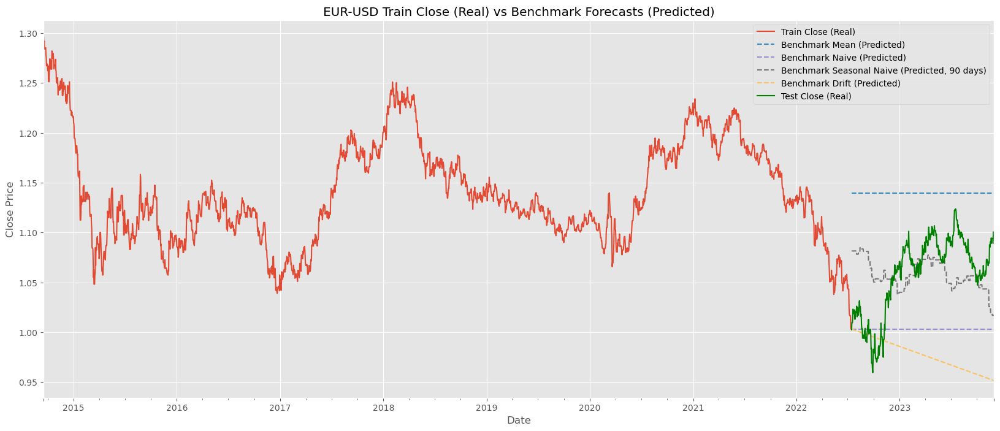

In [246]:
# Plotting
eurusd_train['Close'].plot(label='Train Close (Real)')
eurusd_test['bench_mean_Close'].plot(label='Benchmark Mean (Predicted)', linestyle='--')
eurusd_test['bench_naive_Close'].plot(label='Benchmark Naive (Predicted)', linestyle='--')
eurusd_test['bench_seasonal_naive_Close'].plot(label='Benchmark Seasonal Naive (Predicted, 90 days)', linestyle='--')
eurusd_test['bench_drift_Close'].plot(label='Benchmark Drift (Predicted)', linestyle='--')
eurusd_test['Close'].plot(label='Test Close (Real)', color='green')
# Add a legend
plt.legend()

plt.title('EUR-USD Train Close (Real) vs Benchmark Forecasts (Predicted)')
plt.xlabel('Date')
plt.ylabel('Close Price')

plt.show()

## Checking autocorrelations

In [20]:
acorr = sm.tsa.acf(eurusd['Close'], nlags=eurusd.shape[0]-1)
#Most important lags 1 (day), 30 (month), 90 (quarter), 365 (year)
print(acorr[0],acorr[1],acorr[30],acorr[90],acorr[365])

1.0 0.993167281534787 0.8306380690936128 0.4910203432599326 -0.2839179569093044


In [70]:
T = eurusd.shape[0]
upper_bound = 2 / np.sqrt(T)
lower_bound = -2 / np.sqrt(T)

acf = pd.DataFrame({'lag': np.arange(len(acorr)), 'autocorrelation': acorr})
base = alt.Chart(acf).mark_bar().encode(
    x=alt.X('lag:O', axis=alt.Axis(labelExpr=f"datum.value % {100} === 0 ? datum.value : ''")),  # The ordinal scale for discrete data
    y='autocorrelation:Q'  # The quantitative scale for continuous data
).properties(
    width=1000,
    height=300,
    title=f"EUR-USD Autocorrelation ({len(acf)-1} lags)"
)

upper = alt.Chart(
    pd.DataFrame({'y': [upper_bound]})
).mark_rule(color='red').encode(y='y:Q')

lower = alt.Chart(
    pd.DataFrame({'y': [lower_bound]})
).mark_rule(color='red').encode(y='y:Q')

alt.layer(base, upper, lower)

alt.LayerChart(...)

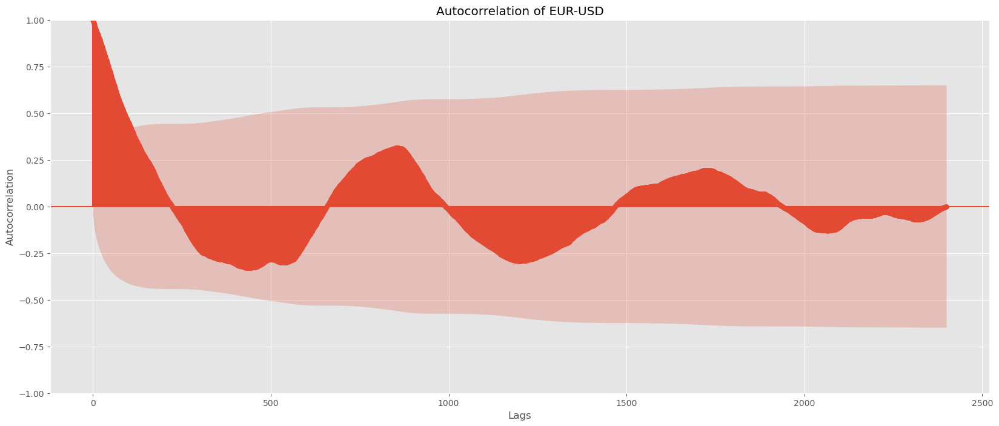

In [62]:
#Autocorrelation (730 lags = 2 years)
plot_acf(x = eurusd['Close'], lags=eurusd.shape[0]-1, alpha=0.05)
plt.title('Autocorrelation of EUR-USD')
plt.xlabel('Lags')
plt.ylabel('Autocorrelation')
plt.grid(True)
plt.show()

In [23]:
#partial auto correlation 
plot_pacf(x = eurusd['Close'], lags=int(eurusd.shape[0]/2)-1, alpha=0.05,method='ywm')  # Adjust 'lags' as needed
plt.title('PACF of EUR-USD')
plt.xlabel('Lags')
plt.ylabel('Autocorrelation')
plt.grid(True)
plt.show()

/var/folders/d3/mnfdbp9x09q8tn1q87l6qx0h0000gn/T/ipykernel_72540/2005078029.py:7: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  plt.show()


In [63]:
def smooth_with_moving_average(df, period, col='Close', plot=True):
    # Check for seasonality using moving averages (statmodels library)
    seasonal = seasonal_decompose(df[col], period=period)
    if plot:
        seasonal.plot()
    return seasonal

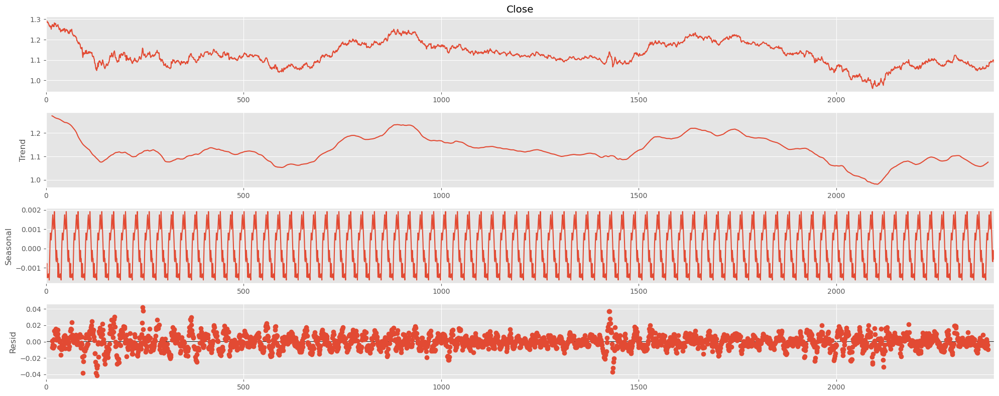

In [72]:
smooth30 = smooth_with_moving_average(eurusd, 30)

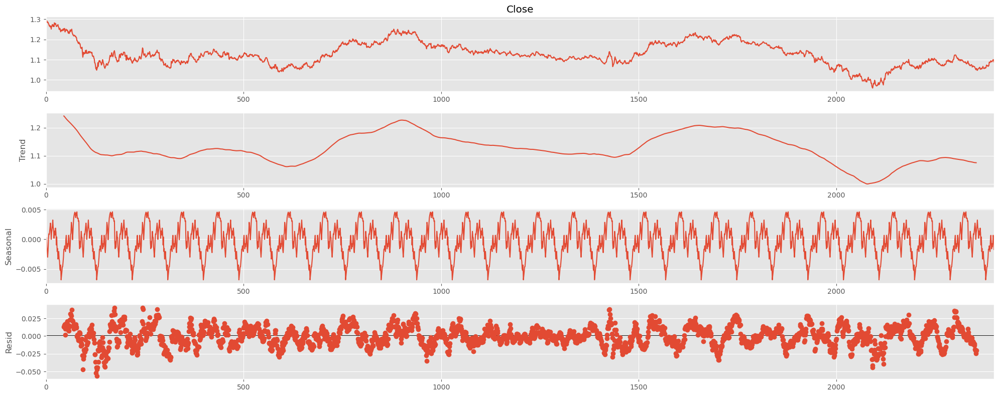

In [73]:
smooth90 = smooth_with_moving_average(eurusd, 90)

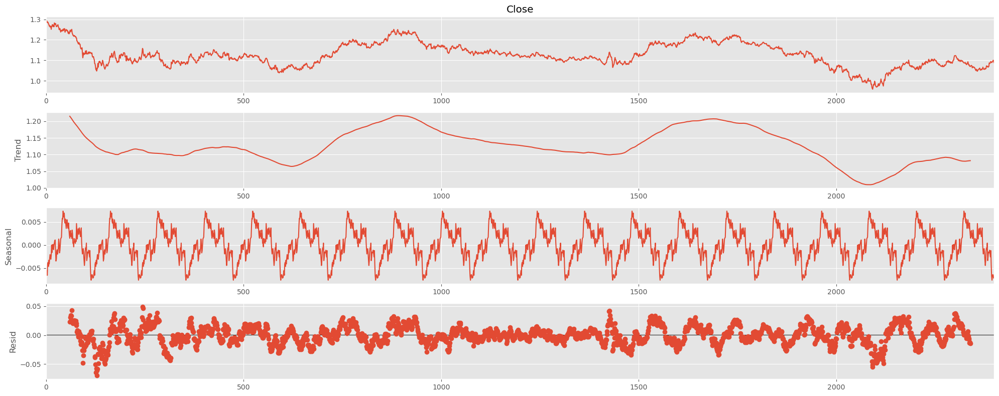

In [77]:
smooth120 = smooth_with_moving_average(eurusd, 120)

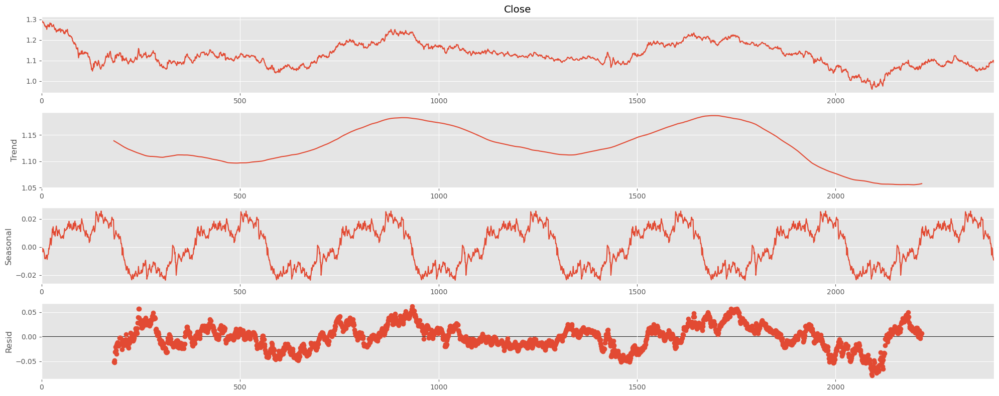

In [78]:
smooth365 = smooth_with_moving_average(eurusd, 365)